In [5]:
import pandas as pd
import numpy as np
from nltk.tokenize import word_tokenize
from pymystem3 import Mystem
from sklearn.metrics import precision_score, roc_auc_score
from sklearn.model_selection import train_test_split
import fasttext
import nltk
import re

In [1]:
import fasttext.util
fasttext.util.download_model('ru', if_exists='ignore')

'cc.ru.300.bin'

In [3]:
ft = fasttext.load_model('cc.ru.300.bin')

# Reading and processing data

In [6]:
df = pd.read_json("case_2_data_for_members.json")

In [7]:
def data_processing(df):
    vacancies = pd.DataFrame()
    failed_resumes = []
    confirmed_resumes = []
    
    for index, row in df.iterrows():
        df_vacancy = pd.DataFrame([row['vacancy']])
        vacancies = pd.concat([vacancies, df_vacancy], ignore_index=True)
        
        failed_resumes_df = pd.DataFrame()
        for sub_row in row['failed_resumes']:
            sub_row['target'] = 0
            df_sub_row = pd.DataFrame([sub_row])
            failed_resumes_df = pd.concat([failed_resumes_df, df_sub_row], ignore_index=True)
        failed_resumes.append(failed_resumes_df)
        
        confirmed_resumes_df = pd.DataFrame()
        for sub_row in row['confirmed_resumes']:
            sub_row['target'] = 1
            df_sub_row = pd.DataFrame([sub_row])
            confirmed_resumes_df = pd.concat([confirmed_resumes_df, df_sub_row], ignore_index=True)
        confirmed_resumes.append(confirmed_resumes_df)
        
    return vacancies, failed_resumes, confirmed_resumes

In [8]:
def train_df_collector(vacancies, failed_resumes, confirmed_resumes):
    train_df = pd.DataFrame()
    vacancies_for_df = pd.DataFrame()
    
    for i in range(vacancies.shape[0]):
        train_df = pd.concat([train_df, failed_resumes[i], confirmed_resumes[i]], ignore_index=True)
        for _ in range(failed_resumes[i].shape[0] + confirmed_resumes[i].shape[0]):
            name_description = pd.concat([vacancies.loc[[i]][['name']], vacancies.loc[[i]][['keywords']], \
                                          vacancies.loc[[i]][['description']], vacancies.loc[[i]][['comment']]], axis=1)
            vacancies_for_df = pd.concat([vacancies_for_df, name_description], ignore_index=True)
    train_df = pd.concat([train_df, vacancies_for_df], axis=1)
    
    train_df.drop(columns=['uuid', 'first_name', 'last_name', 'birth_date', 'country', 'city'], inplace=True)
    train_df.fillna("", inplace=True)
    
    return train_df

In [9]:
vacancies, failed_resumes, confirmed_resumes = data_processing(df)
train_df = train_df_collector(vacancies, failed_resumes, confirmed_resumes)

train_df

,about,key_skills,experienceItem,educationItem,target,languageItems,languageItem,name,keywords,description,comment
0,,"Java, Spring Boot, Java EE, SQL, Hibernate, Gi...","[{'starts': '2022-05-01', 'ends': '2023-10-23'...","[{'year': 1999, 'organization': 'СибГАУ', 'fac...",0,,,Java разработчик команда Инвестиции,,Описание Мы расширяем команды и ищем разработ...,450 на руки
1,"(Гражданин Республики Казахстан, по России им...","ООП, Java, Java Spring Framework, Функциональн...","[{'starts': '2019-12-01', 'ends': None, 'emplo...","[{'year': 2014, 'organization': 'АИНГ-Атырау',...",0,,,Java разработчик команда Инвестиции,,Описание Мы расширяем команды и ищем разработ...,450 на руки
2,"С 1999 года, после появления дома первого ком...","Java, Spring Framework, Hibernate ORM, SQL, Ja...","[{'starts': '2021-11-24', 'ends': None, 'emplo...","[{'year': 2009, 'organization': 'Тюменский гос...",0,[Английский],,Java разработчик команда Инвестиции,,Описание Мы расширяем команды и ищем разработ...,450 на руки
3,"- Oracle Certified Associate, Java SE 7 Progra...","Java, Git, SQL, HTML, JavaScript, CSS, MySQL, ...","[{'starts': '2010-05-01', 'ends': None, 'emplo...","[{'year': 2010, 'organization': 'Новосибирский...",0,"[Русский, Английский]",,Java разработчик команда Инвестиции,,Описание Мы расширяем команды и ищем разработ...,450 на руки
4,,"Java, Spring, Git, PostgreSQL, Hibernate ORM, ...","[{'starts': '2020-09-01', 'ends': None, 'emplo...","[{'year': 2020, 'organization': 'Московский го...",0,"[Русский, Английский]",,Java разработчик команда Инвестиции,,Описание Мы расширяем команды и ищем разработ...,450 на руки
...,...,...,...,...,...,...,...,...,...,...,...
651,,"JavaScript, TypeScript, Vue.js, Nuxt.js, Node....","[{'starts': '2023-08-01', 'ends': None, 'emplo...","[{'year': 2019, 'organization': 'ТИЭИ-Тула', '...",1,,"[Русский, Английский]",Frontend Developer,,"-бренд одежды и аксессуаров, созданный в 2008...",
652,,"JavaScript, TypeScript, Vue js, Nuxt, HTML, CS...","[{'starts': '2021-11-01', 'ends': None, 'emplo...","[{'year': 2012, 'organization': 'Пензенский го...",1,,"[Русский, Английский]",Frontend Developer,,"-бренд одежды и аксессуаров, созданный в 2008...",
653,,"JavaScript, TypeScript, Vue.js, Nuxt, Nest, No...","[{'starts': '2023-04-01', 'ends': None, 'emplo...","[{'year': 2015, 'organization': 'Тульский госу...",1,,"[Русский, Английский]",Frontend Developer,,"-бренд одежды и аксессуаров, созданный в 2008...",
654,"Профессиональные навыки: • JavaScript, базовы...","JavaScript, TypeScript, Vue.js, Nuxt.js, Автом...","[{'starts': '2022-11-01', 'ends': None, 'emplo...","[{'year': 2021, 'organization': 'Канский техно...",1,,,Frontend Developer,,"-бренд одежды и аксессуаров, созданный в 2008...",


# Getting tokens

In [10]:
def clear_text_func(text):
    text_clear = text.lower()

    text_clear = re.sub(r'[^0-9а-яёa-z\-\s]', '', text_clear) # remove excess characters
    text_clear = re.sub(r'\s+', ' ', text_clear) # remove excess whitespaces
    text_clear = text_clear.replace(' - ', ' ')
    text_clear = re.sub(r'(\d)\s(\d)', r'\1\2', text_clear) # concatenate numbers

    m = Mystem()
    text_clear = ''.join(m.lemmatize(text_clear))

    return text_clear

In [424]:
'''from nltk.corpus import stopwords

stop_words = set(stopwords.words('russian'))
filtered_vac_tokens = [word for word in vac_tokens if word not in stop_words]
filtered_rez_tokens = [word for word in rez_tokens if word not in stop_words]

In [11]:
def remove_stopwords(tokens_list, stopwords_list):
    result = []
    for item in tokens_list:
        if item not in stopwords_list:
            result.append(item)
    
    return result

In [12]:
def get_tokens(train_df, stopwords):
    vac_tokens_list, rez_tokens_list = [], []
    for i in range(train_df.shape[0]):
        vac_tokens = remove_stopwords(word_tokenize(clear_text_func(train_df.loc[i]['name'])[:-1] + clear_text_func(train_df.loc[i]['keywords'])[:-1] + \
                                   clear_text_func(train_df.loc[i]['description'])[:-1] + clear_text_func(train_df.loc[i]['comment'])[:-1]), stopwords)
        rez_tokens = remove_stopwords(word_tokenize(clear_text_func(train_df.loc[i]['about'])[:-1] + clear_text_func(train_df.loc[i]['key_skills'])[:-1]), stopwords)

        if i % 100 == 0: print(str(train_df.shape[0]) + '/' + str(i))
            
        vac_tokens_list.append(vac_tokens)
        rez_tokens_list.append(rez_tokens)
        
    return vac_tokens_list, rez_tokens_list

In [13]:
with open('stopwords.txt', 'r', encoding = 'utf-8') as file:
    stopwords = [word[:-1] for word in file]

In [14]:
vac_tokens, rez_tokens = get_tokens(train_df, stopwords)

656/0
656/100
656/200
656/300
656/400
656/500
656/600


# Tokens analysing

In [15]:
vac_tokens

[['java',
  'разработчик',
  'команда',
  'инвестиция',
  'описание',
  'расширять',
  'команда',
  'искать',
  'разработчик',
  'развитие',
  'сервис',
  'инвестиция',
  'лидер',
  'среди',
  'брокер',
  'количество',
  'активный',
  'клиент',
  'инвестиция',
  'удобный',
  'технологичный',
  'понятный',
  'бизнес',
  'менять',
  'подход',
  'ведение',
  'бухгалтерия',
  'обмен',
  'документ',
  'организация',
  'архив',
  'переводить',
  'цифра',
  'страхование',
  'развивать',
  'платформа',
  'прямой',
  'продажа',
  'цель',
  'предсказуемый',
  'удобный',
  'процесс',
  'бизнес',
  'клиент',
  'платежный',
  'технология',
  'процессинг',
  'заниматься',
  'разработка',
  'поддержка',
  'платежный',
  'шлюз',
  'банк',
  'задача',
  'шлюз',
  'определять',
  'тип',
  'платеж',
  'наполнять',
  'данные',
  'система',
  'банк',
  'проверять',
  'разрешенность',
  'операция',
  'интересный',
  'разнообразный',
  'задача',
  'опытный',
  'команда',
  'отличный',
  'возможность',
  'рос

In [16]:
rez_tokens

[['java',
  'spring',
  'boot',
  'java',
  'ee',
  'sql',
  'hibernate',
  'git',
  'docker',
  'высоконагруженный',
  'система',
  'postgresql',
  'linux'],
 ['гражданин',
  'республика',
  'казахстан',
  'иметься',
  'жительство',
  'гражданство',
  'менять',
  'планировать',
  'ооп',
  'java',
  'java',
  'spring',
  'framework',
  'функциональный',
  'программирование',
  'разработка',
  'программный',
  'обеспечение',
  'многопоточность',
  'kotlin',
  'mysql',
  'docker',
  'linux'],
 ['1999',
  'появление',
  'компьютер',
  'увлекаться',
  'компьютерный',
  'технология',
  '2001',
  'становиться',
  'доступный',
  'интернет',
  'dial-up',
  'начинать',
  'изучать',
  'создание',
  'сайт',
  'html',
  'окончание',
  'школа',
  'поступать',
  'заканчивать',
  'университет',
  'специальность',
  'компьютерный',
  'графика',
  'web-дизайн',
  'экономический',
  'специальность',
  'web-разработка',
  'из-за',
  'нехватка',
  'забросить',
  '2014',
  'увлекаться',
  'станок',
  'чпу'

In [17]:
length_list = []
for item in vac_tokens:
    length_list.append(len(item))
vac_avarage_length = sum(length_list)/len(length_list)
vac_min_length = min(length_list)
vac_max_length = max(length_list)

In [18]:
print(vac_avarage_length, vac_min_length, vac_max_length)

224.6143292682927 41 502


In [19]:
length_list = []
for item in rez_tokens:
    if len(item) >= 20:
        length_list.append(len(item))
rez_avarage_length = sum(length_list)/len(length_list)
rez_min_length = min(length_list)
rez_max_length = max(length_list)

In [20]:
print(rez_avarage_length, rez_min_length, rez_max_length)

54.47948164146868 20 357


In [21]:
vac_parts_number = 20
rez_parts_number = 20

# Tokens grouping

In [22]:
def tokens_grouping(tokens_list, parts_number):
    grouping_list = []
    for item in tokens_list:
        part_len = len(item) // parts_number
        token_index = 0
        grouping_list.append([])
        if part_len >= 1:
            for i in range(parts_number):
                grouping_list[-1].append([])
                while True:
                    grouping_list[-1][-1].append(item[token_index])
                    token_index += 1
                    if (i < parts_number - 1 and len(grouping_list[-1][-1]) == part_len) or (i == parts_number - 1 and token_index == len(item)):
                        break
    return grouping_list            

In [23]:
vac_grouped_tokens = tokens_grouping(vac_tokens, vac_parts_number)
rez_grouped_tokens = tokens_grouping(rez_tokens, rez_parts_number)

In [24]:
vac_grouped_tokens

[[['java',
   'разработчик',
   'команда',
   'инвестиция',
   'описание',
   'расширять',
   'команда',
   'искать',
   'разработчик'],
  ['развитие',
   'сервис',
   'инвестиция',
   'лидер',
   'среди',
   'брокер',
   'количество',
   'активный',
   'клиент'],
  ['инвестиция',
   'удобный',
   'технологичный',
   'понятный',
   'бизнес',
   'менять',
   'подход',
   'ведение',
   'бухгалтерия'],
  ['обмен',
   'документ',
   'организация',
   'архив',
   'переводить',
   'цифра',
   'страхование',
   'развивать',
   'платформа'],
  ['прямой',
   'продажа',
   'цель',
   'предсказуемый',
   'удобный',
   'процесс',
   'бизнес',
   'клиент',
   'платежный'],
  ['технология',
   'процессинг',
   'заниматься',
   'разработка',
   'поддержка',
   'платежный',
   'шлюз',
   'банк',
   'задача'],
  ['шлюз',
   'определять',
   'тип',
   'платеж',
   'наполнять',
   'данные',
   'система',
   'банк',
   'проверять'],
  ['разрешенность',
   'операция',
   'интересный',
   'разнообразный',
 

# Building an array of cosine distances

In [25]:
from scipy.spatial.distance import cdist

In [26]:
mom_vec = ft.get_word_vector('мама')
dad_vec = ft.get_word_vector('папа')
croc_vec = ft.get_word_vector('крокодил')

In [27]:
cdist(mom_vec[None, :], dad_vec[None, :], metric="cosine")

array([[0.28536897]])

In [28]:
cdist(mom_vec[None, :], croc_vec[None, :], metric="cosine")

array([[0.75033596]])

In [151]:
def bild_cdist_array(vac_grouped_tokens, rez_grouped_tokens, vac_parts_number, rez_parts_number):
    cdist_array = []
    for i in range(len(vac_grouped_tokens)):
        cdist_array.append([])
        if len(vac_grouped_tokens[i]) != 0 and len(rez_grouped_tokens[i]) != 0:
            for vac_item in vac_grouped_tokens[i]:
                for rez_item in rez_grouped_tokens[i]:
                    vac_vector = ft.get_sentence_vector(" ".join(vac_item))
                    rez_vector = ft.get_sentence_vector(" ".join(rez_item))
                    cdist_array[-1].append(cdist(vac_vector[None, :], rez_vector[None, :], metric="cosine")[0][0])
        else:
            cdist_array[-1] += [1] * vac_parts_number * rez_parts_number
                
    return cdist_array

In [152]:
cdist_array = bild_cdist_array(vac_grouped_tokens, rez_grouped_tokens, vac_parts_number, rez_parts_number)

In [153]:
cdist_array

[[1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,


# Classical model

In [32]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from yellowbrick.classifier import ROCAUC

In [154]:
target_array = []
for targ in list(train_df['target']):
    target_array.append(targ)
target_array = np.array(target_array)

In [155]:
X_train, X_test, y_train, y_test = train_test_split(cdist_array, target_array, test_size=0.2,
random_state=42)

In [156]:
model = RandomForestClassifier()

In [157]:
param_grid = { 'n_estimators': [2, 100],
'max_features': ['sqrt', 'log2'],
'max_depth' : [4,5,6,7,8],
'criterion' :['gini', 'entropy']}
CV_rfc = GridSearchCV(estimator=model, param_grid=param_grid , scoring='accuracy', refit=True)

In [158]:
g_res = CV_rfc.fit(X_train, y_train)
print(g_res.best_params_)

{'criterion': 'gini', 'max_depth': 8, 'max_features': 'log2', 'n_estimators': 100}


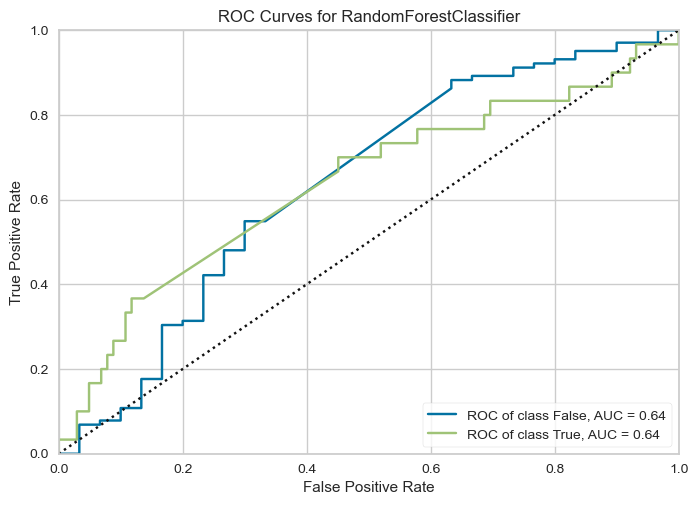

<Axes: title={'center': 'ROC Curves for RandomForestClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [159]:
model = RandomForestClassifier(criterion='entropy', max_depth=4, max_features='sqrt', n_estimators=100)
visualizer = ROCAUC(model , classes=[False, True] , micro=False , macro=False)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show()

# Model training

In [44]:
import matplotlib.pyplot as plt
import seaborn as sns
import torch
from torch import nn, optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets
import torchvision.transforms as T
from IPython.display import Image
from skimage import io
from torchvision.utils import make_grid

C:\Anaconda\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [160]:
target_array = []
for targ in list(train_df['target']):
    target_array.append(targ)
target_array = np.array(target_array)

In [161]:
X_train, X_test, y_train, y_test = train_test_split(cdist_array, target_array, test_size=0.2,
random_state=42)

In [162]:
class RezClass(Dataset):
    def __init__(self, data, targets, transform=None):
        self.data = torch.Tensor(data)
        self.targets = torch.LongTensor(targets)
        self.transform = transform
    def __getitem__(self, index):
        x = self.data[index]
        y = self.targets[index] 
        return x, y
  
    def __len__(self):
        return len(self.data)

In [163]:
train_dataset=RezClass(X_train,y_train)
test_dataset=RezClass(X_test,y_test)

In [164]:
batch_size=32 # размер пакета
train_loader = DataLoader(train_dataset, batch_size=batch_size,shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size,shuffle=True)
dataloaders = {"train": train_loader,"validation": test_loader}

In [165]:
import torch.nn as nn

class Rez_NN(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(vac_parts_number * rez_parts_number, 300)
        self.fc2 = nn.Linear(300, 200)
        self.fc3 = nn.Linear(200, 100)
        self.fc4 = nn.Linear(100, 10)
        self.fc5 = nn.Linear(10, 2)
        self.activation = nn.LeakyReLU(inplace=True)

    def forward(self,x): # прямой проход модели
        x = x
        x = self.fc1(x)
        x = self.activation(x)
        x = self.fc2(x)
        x = self.activation(x)
        x = self.fc3(x)
        x = self.activation(x)
        x = self.fc4(x)
        x = self.activation(x)
        x = self.fc5(x)
        return x

In [166]:
from livelossplot import PlotLosses

device = 'cpu'

def train_model(model, criterion, optimizer, num_epochs=10):
    liveloss = PlotLosses()
    model = model.to(device)
  
    for epoch in range(num_epochs):
        logs = {}
        for phase in ['train', 'validation']: # две фазы: тренировочная и валидационная
            if phase == 'train':
                model.train() # режим тренировки - веса могут обновляться
            else:
                model.eval()  # режим валидации - веса заморожены

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                outputs = model(inputs) # прямой проход модели
                loss = criterion(outputs, labels) # ошибка пакета

                if phase == 'train':
                    optimizer.zero_grad() # обнуляем градиенты
                    loss.backward()  # обратное распространение ошибки
                    optimizer.step() # обновление весов алгоритмом оптимизации

                _, preds = torch.max(outputs, 1) 
                running_loss += loss.detach() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.float() / len(dataloaders[phase].dataset)
          
            prefix = ''
            if phase == 'validation':
                prefix = 'val_'

            logs[prefix + 'log loss'] = epoch_loss.item()
            logs[prefix + 'accuracy'] = epoch_acc.item()
      
        liveloss.update(logs)
        liveloss.send()

In [167]:
model=Rez_NN()
model.to('cpu')

Rez_NN(
  (fc1): Linear(in_features=400, out_features=300, bias=True)
  (fc2): Linear(in_features=300, out_features=200, bias=True)
  (fc3): Linear(in_features=200, out_features=100, bias=True)
  (fc4): Linear(in_features=100, out_features=10, bias=True)
  (fc5): Linear(in_features=10, out_features=2, bias=True)
  (activation): LeakyReLU(negative_slope=0.01, inplace=True)
)

In [168]:
from torch import optim
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters())

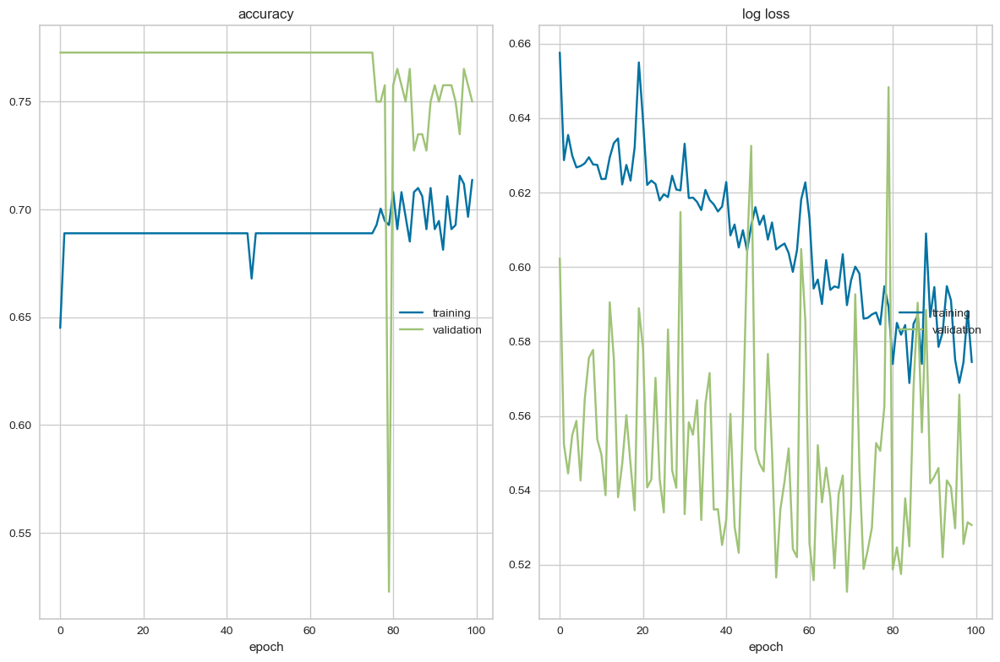

accuracy
	training         	 (min:    0.645, max:    0.716, cur:    0.714)
	validation       	 (min:    0.523, max:    0.773, cur:    0.750)
log loss
	training         	 (min:    0.569, max:    0.658, cur:    0.574)
	validation       	 (min:    0.513, max:    0.648, cur:    0.531)


In [169]:
train_model(model, criterion, optimizer, num_epochs=100)

In [170]:
optimizer = optim.Adam(model.parameters())
criterion = nn.CrossEntropyLoss()

In [171]:
from ignite.engine import Events, create_supervised_trainer, create_supervised_evaluator
from ignite.metrics import Accuracy, Loss, RunningAverage, ConfusionMatrix
from ignite.handlers import ModelCheckpoint, EarlyStopping
from ignite.contrib.handlers import ProgressBar, HandlersTimeProfiler
from ignite.handlers import Checkpoint, global_step_from_engine

In [172]:
trainer = create_supervised_trainer(model, optimizer, criterion, device='cpu')

In [173]:
metrics = { "loss" : Loss(criterion), 
           "accuracy" : Accuracy(),
            "cm": ConfusionMatrix(num_classes=2)}

In [174]:
train_evaluator = create_supervised_evaluator(model, metrics = metrics, device = 'cpu')
test_evaluator = create_supervised_evaluator(model, metrics = metrics, device = 'cpu')

In [175]:
training_history = {'accuracy':[],'loss':[]}
test_history = {'accuracy':[],'loss':[]}
last_epoch = []

In [176]:
@trainer.on(Events.EPOCH_COMPLETED)
def log_training_results(trainer):
    train_evaluator.run(train_loader)
    metrics = train_evaluator.state.metrics
    accuracy = metrics['accuracy']*100
    loss = metrics['loss']
    last_epoch.append(0)
    training_history['accuracy'].append(accuracy)
    training_history['loss'].append(loss)
    print("Результат обучения - Эпоха: {}  Сред. точность: {:.2f} Сред. ошибка: {:.5f}"
          .format(trainer.state.epoch, accuracy, loss))

In [177]:
@trainer.on(Events.EPOCH_COMPLETED)
def log_test_results(trainer):
    test_evaluator.run(test_loader)
    metrics = test_evaluator.state.metrics
    accuracy = metrics['accuracy']*100
    loss = metrics['loss']
    test_history['accuracy'].append(accuracy)
    test_history['loss'].append(loss)
    print("Результат валидации - Эпоха: {}  Сред. точность: {:.2f} Сред. ошибка: {:.5f}"
          .format(trainer.state.epoch, accuracy, loss))

In [178]:
breaker = EarlyStopping(patience = 10, score_function = lambda engine : engine.state.metrics['accuracy'],
                        trainer = trainer)
test_evaluator.add_event_handler(Events.COMPLETED, breaker);

In [180]:
to_save = {'model': model}
saver = Checkpoint(
    to_save, './models',
    n_saved=2, filename_prefix='best',
    score_name="accuracy",
    global_step_transform=global_step_from_engine(trainer),
)
test_evaluator.add_event_handler(Events.COMPLETED, saver);

In [181]:
from tqdm.notebook import tqdm
profiler = HandlersTimeProfiler()
profiler.attach(trainer)
pbar = ProgressBar(persist=True,
    bar_format = '')
pbar.attach(trainer, output_transform = lambda x : {"loss" : x})

In [182]:
trainer.run(train_loader, max_epochs=10)

  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 1  Сред. точность: 71.56 Сред. ошибка: 0.56800
Результат валидации - Эпоха: 1  Сред. точность: 75.00 Сред. ошибка: 0.52728


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 2  Сред. точность: 69.66 Сред. ошибка: 0.57341
Результат валидации - Эпоха: 2  Сред. точность: 75.76 Сред. ошибка: 0.53044


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 3  Сред. точность: 71.37 Сред. ошибка: 0.56456
Результат валидации - Эпоха: 3  Сред. точность: 74.24 Сред. ошибка: 0.55503


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 4  Сред. точность: 58.40 Сред. ошибка: 0.63930
Результат валидации - Эпоха: 4  Сред. точность: 52.27 Сред. ошибка: 0.71344


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 5  Сред. точность: 73.09 Сред. ошибка: 0.58003
Результат валидации - Эпоха: 5  Сред. точность: 72.73 Сред. ошибка: 0.59058


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 6  Сред. точность: 72.52 Сред. ошибка: 0.55901
Результат валидации - Эпоха: 6  Сред. точность: 74.24 Сред. ошибка: 0.54486


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 7  Сред. точность: 71.56 Сред. ошибка: 0.55986
Результат валидации - Эпоха: 7  Сред. точность: 75.00 Сред. ошибка: 0.54002


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 8  Сред. точность: 71.56 Сред. ошибка: 0.56119
Результат валидации - Эпоха: 8  Сред. точность: 75.00 Сред. ошибка: 0.54121


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 9  Сред. точность: 71.95 Сред. ошибка: 0.55984
Результат валидации - Эпоха: 9  Сред. точность: 74.24 Сред. ошибка: 0.54116


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 10  Сред. точность: 70.23 Сред. ошибка: 0.57864
Результат валидации - Эпоха: 10  Сред. точность: 76.52 Сред. ошибка: 0.53315


State:
	iteration: 170
	epoch: 10
	epoch_length: 17
	max_epochs: 10
	output: 0.6921548247337341
	batch: <class 'list'>
	metrics: <class 'dict'>
	dataloader: <class 'torch.utils.data.dataloader.DataLoader'>
	seed: <class 'NoneType'>
	times: <class 'dict'>

# Model training with batchnorm

In [183]:
import torch.nn as nn

class Rez_NN_with_batchnorm(nn.Module):
    def __init__(self):
        super(Rez_NN_with_batchnorm, self).__init__()
        self.pipe = nn.Sequential(
            nn.Linear(vac_parts_number * rez_parts_number, 300, bias=False),
            nn.ReLU6(inplace=True),
            nn.BatchNorm1d(300),

            nn.Linear(300, 200, bias=False),
            nn.ReLU6(inplace=True),
            nn.BatchNorm1d(200),

            nn.Linear(200, 100, bias=False),
            nn.ReLU6(inplace=True),
            nn.BatchNorm1d(100),

            nn.Linear(100, 10, bias=False),
            nn.ReLU6(inplace=True),
            nn.BatchNorm1d(10),

            nn.Linear(10, 2),
            nn.ReLU6(inplace=True))
            
    def forward(self, x):
        return self.pipe(x)

In [184]:
model=Rez_NN_with_batchnorm()
model.to('cpu')

Rez_NN_with_batchnorm(
  (pipe): Sequential(
    (0): Linear(in_features=400, out_features=300, bias=False)
    (1): ReLU6(inplace=True)
    (2): BatchNorm1d(300, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Linear(in_features=300, out_features=200, bias=False)
    (4): ReLU6(inplace=True)
    (5): BatchNorm1d(200, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): Linear(in_features=200, out_features=100, bias=False)
    (7): ReLU6(inplace=True)
    (8): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): Linear(in_features=100, out_features=10, bias=False)
    (10): ReLU6(inplace=True)
    (11): BatchNorm1d(10, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): Linear(in_features=10, out_features=2, bias=True)
    (13): ReLU6(inplace=True)
  )
)

In [185]:
from torch import optim
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters())

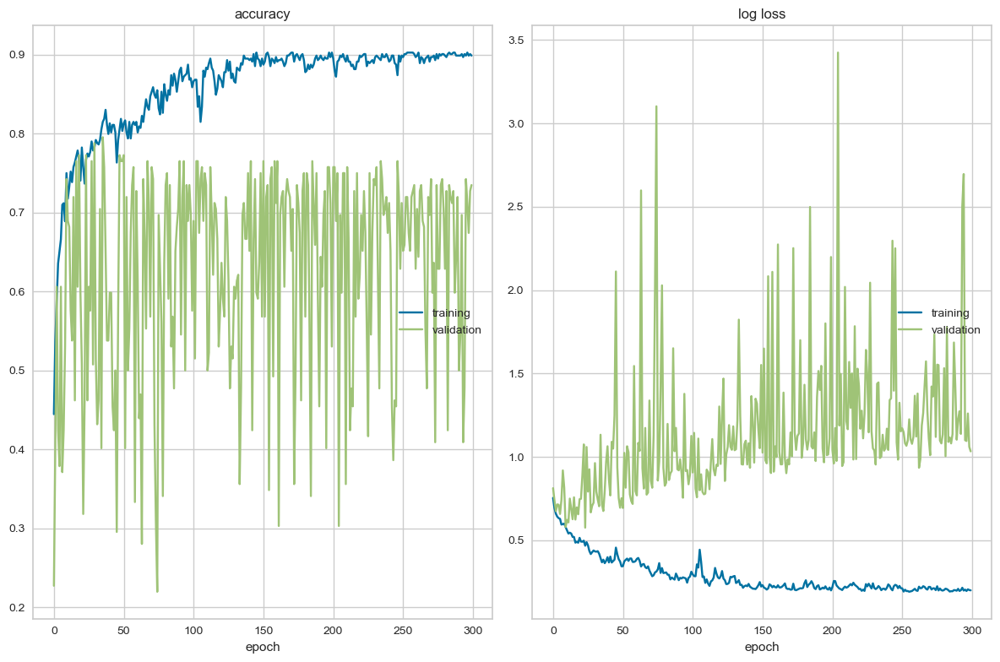

accuracy
	training         	 (min:    0.445, max:    0.903, cur:    0.899)
	validation       	 (min:    0.220, max:    0.795, cur:    0.735)
log loss
	training         	 (min:    0.191, max:    0.754, cur:    0.200)
	validation       	 (min:    0.576, max:    3.425, cur:    1.033)


In [186]:
train_model(model, criterion, optimizer, num_epochs=300)

In [199]:
optimizer = optim.Adam(model.parameters())
criterion = nn.CrossEntropyLoss()

In [200]:
from ignite.engine import Events, create_supervised_trainer, create_supervised_evaluator
from ignite.metrics import Accuracy, Loss, RunningAverage, ConfusionMatrix
from ignite.handlers import ModelCheckpoint, EarlyStopping
from ignite.contrib.handlers import ProgressBar, HandlersTimeProfiler
from ignite.handlers import Checkpoint, global_step_from_engine

In [201]:
trainer = create_supervised_trainer(model, optimizer, criterion, device='cpu')

In [202]:
metrics = { "loss" : Loss(criterion), 
           "accuracy" : Accuracy(),
            "cm": ConfusionMatrix(num_classes=2)}

In [203]:
train_evaluator = create_supervised_evaluator(model, metrics = metrics, device = 'cpu')
test_evaluator = create_supervised_evaluator(model, metrics = metrics, device = 'cpu')

In [204]:
@trainer.on(Events.EPOCH_COMPLETED)
def log_training_results(trainer):
    train_evaluator.run(train_loader)
    metrics = train_evaluator.state.metrics
    accuracy = metrics['accuracy']*100
    loss = metrics['loss']
    last_epoch.append(0)
    training_history['accuracy'].append(accuracy)
    training_history['loss'].append(loss)
    print("Результат обучения - Эпоха: {}  Сред. точность: {:.2f} Сред. ошибка: {:.5f}"
          .format(trainer.state.epoch, accuracy, loss))

In [205]:
@trainer.on(Events.EPOCH_COMPLETED)
def log_test_results(trainer):
    test_evaluator.run(test_loader)
    metrics = test_evaluator.state.metrics
    accuracy = metrics['accuracy']*100
    loss = metrics['loss']
    test_history['accuracy'].append(accuracy)
    test_history['loss'].append(loss)
    print("Результат валидации - Эпоха: {}  Сред. точность: {:.2f} Сред. ошибка: {:.5f}"
          .format(trainer.state.epoch, accuracy, loss))

In [206]:
breaker = EarlyStopping(patience = 10, score_function = lambda engine : engine.state.metrics['accuracy'],
                        trainer = trainer)
test_evaluator.add_event_handler(Events.COMPLETED, breaker);

In [207]:
to_save = {'model': model}
saver = Checkpoint(
    to_save, './models2',
    n_saved=2, filename_prefix='best',
    score_name="accuracy",
    global_step_transform=global_step_from_engine(trainer),
)
test_evaluator.add_event_handler(Events.COMPLETED, saver);

In [208]:
from tqdm.notebook import tqdm
profiler = HandlersTimeProfiler()
profiler.attach(trainer)
pbar = ProgressBar(persist=True,
    bar_format = '')
pbar.attach(trainer, output_transform = lambda x : {"loss" : x})

In [209]:
trainer.run(train_loader, max_epochs=100)

  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 1  Сред. точность: 59.54 Сред. ошибка: 1.90680
Результат валидации - Эпоха: 1  Сред. точность: 40.91 Сред. ошибка: 3.16978


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 2  Сред. точность: 85.50 Сред. ошибка: 0.42447
Результат валидации - Эпоха: 2  Сред. точность: 75.00 Сред. ошибка: 1.03514


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 3  Сред. точность: 70.80 Сред. ошибка: 1.29176
Результат валидации - Эпоха: 3  Сред. точность: 42.42 Сред. ошибка: 2.70735


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 4  Сред. точность: 78.44 Сред. ошибка: 0.85257
Результат валидации - Эпоха: 4  Сред. точность: 75.76 Сред. ошибка: 1.19267


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 5  Сред. точность: 90.27 Сред. ошибка: 0.19673
Результат валидации - Эпоха: 5  Сред. точность: 71.97 Сред. ошибка: 1.08070


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 6  Сред. точность: 90.27 Сред. ошибка: 0.19518
Результат валидации - Эпоха: 6  Сред. точность: 69.70 Сред. ошибка: 1.19823


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 7  Сред. точность: 73.66 Сред. ошибка: 0.73971
Результат валидации - Эпоха: 7  Сред. точность: 41.67 Сред. ошибка: 2.10098


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 8  Сред. точность: 75.57 Сред. ошибка: 0.50811
Результат валидации - Эпоха: 8  Сред. точность: 51.52 Сред. ошибка: 1.44831


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 9  Сред. точность: 90.27 Сред. ошибка: 0.19520
Результат валидации - Эпоха: 9  Сред. точность: 69.70 Сред. ошибка: 1.08159


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 10  Сред. точность: 86.26 Сред. ошибка: 0.30132
Результат валидации - Эпоха: 10  Сред. точность: 63.64 Сред. ошибка: 1.39595


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 11  Сред. точность: 86.83 Сред. ошибка: 0.33439
Результат валидации - Эпоха: 11  Сред. точность: 72.73 Сред. ошибка: 1.03513


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 12  Сред. точность: 89.12 Сред. ошибка: 0.22839
Результат валидации - Эпоха: 12  Сред. точность: 72.73 Сред. ошибка: 1.03395


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 13  Сред. точность: 71.95 Сред. ошибка: 0.61499
Результат валидации - Эпоха: 13  Сред. точность: 44.70 Сред. ошибка: 1.65515


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 14  Сред. точность: 79.58 Сред. ошибка: 0.55270
Результат валидации - Эпоха: 14  Сред. точность: 76.52 Сред. ошибка: 1.03487


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 15  Сред. точность: 88.55 Сред. ошибка: 0.28415
Результат валидации - Эпоха: 15  Сред. точность: 71.97 Сред. ошибка: 1.03043


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 16  Сред. точность: 85.88 Сред. ошибка: 0.31602
Результат валидации - Эпоха: 16  Сред. точность: 69.70 Сред. ошибка: 1.08279


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 17  Сред. точность: 78.82 Сред. ошибка: 0.48056
Результат валидации - Эпоха: 17  Сред. точность: 61.36 Сред. ошибка: 1.53734


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 18  Сред. точность: 69.27 Сред. ошибка: 1.17094
Результат валидации - Эпоха: 18  Сред. точность: 43.18 Сред. ошибка: 2.37374


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 19  Сред. точность: 83.59 Сред. ошибка: 0.44467
Результат валидации - Эпоха: 19  Сред. точность: 63.64 Сред. ошибка: 1.36785


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 20  Сред. точность: 89.89 Сред. ошибка: 0.19833
Результат валидации - Эпоха: 20  Сред. точность: 68.18 Сред. ошибка: 1.16785


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 21  Сред. точность: 90.08 Сред. ошибка: 0.19952
Результат валидации - Эпоха: 21  Сред. точность: 71.97 Сред. ошибка: 1.09483


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 22  Сред. точность: 88.17 Сред. ошибка: 0.24237
Результат валидации - Эпоха: 22  Сред. точность: 71.97 Сред. ошибка: 1.02228


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 23  Сред. точность: 90.27 Сред. ошибка: 0.19196
Результат валидации - Эпоха: 23  Сред. точность: 71.21 Сред. ошибка: 1.11229


  6%|5         | 1/17 [00:00<?, ?it/s]

Результат обучения - Эпоха: 24  Сред. точность: 87.40 Сред. ошибка: 0.30831


2024-05-27 01:51:29,202 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Результат валидации - Эпоха: 24  Сред. точность: 72.73 Сред. ошибка: 1.09028


State:
	iteration: 408
	epoch: 24
	epoch_length: 17
	max_epochs: 100
	output: 1.327042818069458
	batch: <class 'list'>
	metrics: <class 'dict'>
	dataloader: <class 'torch.utils.data.dataloader.DataLoader'>
	seed: <class 'NoneType'>
	times: <class 'dict'>